## Making Music From Images

This project will showcase how an image can be turned into sound in Python. The program will take a picture as input and produce a numpy array composed of frequencies that can be played.

The basic idea is as follows:

- Images are made of pixels.
- Pixels are composed of arrays of numbers that designate color
- Color is described via color spaces like RGB or HSV for example
- The color could be potentially mapped into a wavelength
- Wavelength can be readily converted into a frequency
- Sound is vibration that can be chracterized by frequencies
- Therefore, an image could be translated into sound

### Modules used in this work
Here are the most important modules used for this project:

- open cv : Used to carry out operations on images
- numpy : Used to perform computations on array data
- pandas : Used to load, process, analyze, operate and export dataframes
- matplotlib.pyplot :Used for plotting/visualizing our results



In [4]:
# Importing modules
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm
import numpy as np
import pandas as pd
import IPython.display as ipd
import librosa
from midiutil import MIDIFile
import random
from pedalboard import Pedalboard, Chorus, Reverb
from pedalboard.io import AudioFile

### Loading Image
I'll start by loading the image using the imread function in OpenCV. The imread function loads images in BGR format by default so I'll change this to RGB to ensure that the colors are parsed/displayed correctly. The image on the left is how imread loads the image (BGR format) and the image on the right is after converting the color space to RGB (this is how the picture looked from the source file.

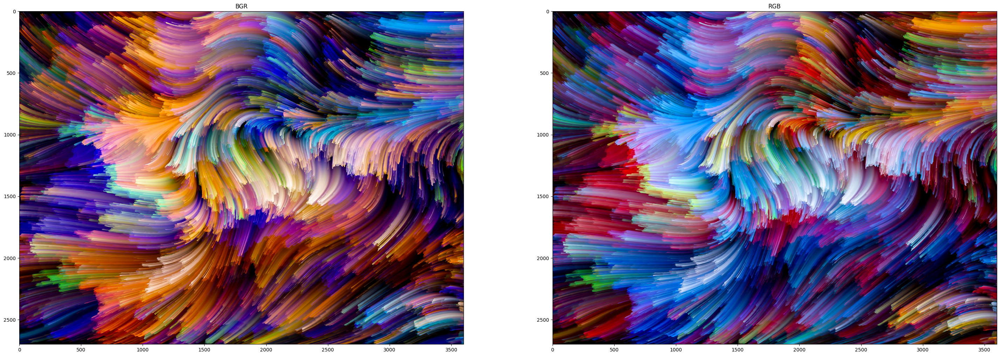

           Image Properties
Height =  2700 Width =  3600
Number of pixels in image =  9720000


In [5]:
# Load the image
ori_img = cv2.imread('colors.jpeg')
img = cv2.cvtColor(ori_img, cv2.COLOR_BGR2RGB)

# Get shape of image
height, width, depth = img.shape
dpi = plt.rcParams['figure.dpi']
figsize = width / float(dpi), height / float(dpi)

#Plot the image
fig, axs = plt.subplots(1, 2, figsize = figsize)
axs[0].title.set_text('BGR') 
axs[0].imshow(ori_img)
axs[1].title.set_text('RGB') 
axs[1].imshow(img)
plt.show()
print('           Image Properties')
print('Height = ',height, 'Width = ', width)
print('Number of pixels in image = ', height * width)


### Using HSV Color Space
HSV is color space that is controlled by 3 values. The 3 values are Hue, Saturation, and Brightness.

Hue is defined as "the degree to which a stimulus can be described as similar to or different from stimuli that are described as red, orange, yellow, green, blue, violet". In other words, Hue represents color.

Saturation is defined as "colorfulness of an area judged in proportion to its brightness". In other words, Saturation represents the amount to which a color is mixed with white.

Brightness is defined as "perception elicited by the luminance of a visual target". In other words, Saturation represents the amount to which a color is mixed with black.

Hue values of basic colors:

- Orange 0-44
- Yellow 44- 76
- Green 76-150
- Blue 150-260
- Violet 260-320
- Red 320-360
I'll work in HSV color space because I figured it be a little easier to work

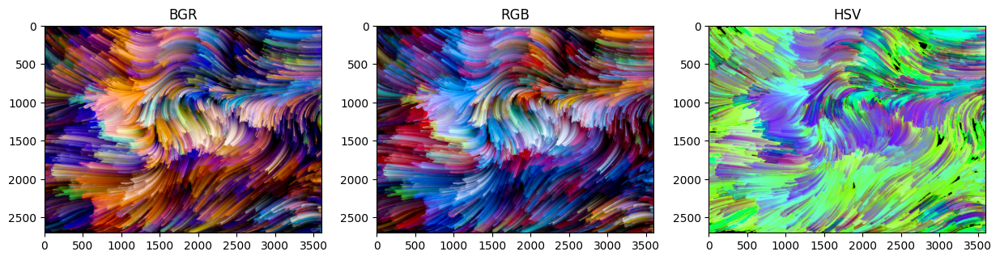

In [6]:
#Need function that reads pixel hue value 
hsv = cv2.cvtColor(ori_img, cv2.COLOR_BGR2HSV)
#Plot the image
fig, axs = plt.subplots(1, 3, figsize = (15,15))
names = ['BGR','RGB','HSV']
imgs  = [ori_img, img, hsv]
i = 0
for elem in imgs:
    axs[i].title.set_text(names[i])
    axs[i].imshow(elem)
    axs[i].grid(False)
    i += 1
plt.show()

### Extract Hue from Image
Now that our image is in HSV, let's extract the hue (H) value from every pixel. This can be done via a nested for loop over the height and width of the image.

In [7]:
# Extract hue from image
i=0 ; j=0
#Initialize array to loop over the height and width of the image.
hues = [] 
for i in range(height):
    for j in range(width):
        hue = hsv[i][j][0] #This is the hue value at pixel coordinate (i,j)
        hues.append(hue)

Now that we have an array containing the H value for every pixel, I'll place that result into a pandas dataframe. Each row in the dataframe is a pixel and thus each column will contain information about that pixel. I'll call this dataframe pixels_df

In [8]:
# Creating a hue dataframe
pixels_df = pd.DataFrame(hues, columns=['hues'])
pixels_df.tail

<bound method NDFrame.tail of          hues
0           0
1           0
2         120
3         120
4         120
...       ...
9719995    19
9719996    19
9719997    19
9719998    19
9719999    19

[9720000 rows x 1 columns]>

### Converting hues to frequencies 
My idea at converting a hue value into a frequency involved a simple mapping between a predetermined set of frequencies to the H value. The mapping function is shown below. The function takes the H value and an array containing frequencies to map H to as inputs. Below, the example uses an array called scale_freqs to define the frequencies. The frequencies used in scale_freqs correspond to the A Harmonic Minor Scale. Then, an array of threshold values (called thresholds) for H is defined. This array of thresholds can then be used to convert H into a frequency from scale_freqs.

In [10]:
# Converting hues to frequency
# Define frequencies that make up A-Harmonic Minor Scale
scale_freqs = [220.00, 246.94 ,261.63, 293.66, 329.63, 349.23, 415.30] 
def hue2freq(h,scale_freqs):
    thresholds = [26 , 52 , 78 , 104,  128 , 154 , 180]
    note = scale_freqs[0]
    if (h <= thresholds[0]):
         note = scale_freqs[0]
    elif (h > thresholds[0]) & (h <= thresholds[1]):
        note = scale_freqs[1]
    elif (h > thresholds[1]) & (h <= thresholds[2]):
        note = scale_freqs[2]
    elif (h > thresholds[2]) & (h <= thresholds[3]):
        note = scale_freqs[3]
    elif (h > thresholds[3]) & (h <= thresholds[4]):    
        note = scale_freqs[4]
    elif (h > thresholds[4]) & (h <= thresholds[5]):
        note = scale_freqs[5]
    elif (h > thresholds[5]) & (h <= thresholds[6]):
        note = scale_freqs[6]
    else:
        note = scale_freqs[0]
    
    return note

I can then apply this mapping using a lambda function to every row in the hues column to get the frequencies associated with each H value. The results of this process will be saved into a column called notes

In [11]:

pixels_df['notes'] = pixels_df.apply(lambda row : hue2freq(row['hues'],scale_freqs), axis = 1)     
pixels_df

,hues,notes
0,0,220.00
1,0,220.00
2,120,329.63
3,120,329.63
4,120,329.63
...,...,...
9719995,19,220.00
9719996,19,220.00
9719997,19,220.00
9719998,19,220.00


In [12]:
# Converting the notes column into a numpy array    and use this to make a playable audio file
frequencies = pixels_df['notes'].to_numpy()

Finally, I can make a song out of the pixels using the method below. The picture I am using has 230,400 pixels. Even though, I could make a song that includes every pixel, I decided to restrict my song to include only the first 60 pixels for now because if I were to use all of them in order, the song would be over 6 hours long if I were to give every note a duration of 0.1s

In [14]:
# Using the first 60 pixels to generate songs
song = np.array([]) 
sr = 22050 # sample rate
T = 0.1    # 0.1 second duration
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
# Make a song with numpy array
# nPixels = int(len(frequencies)) #All pixels in image
nPixels = 60
for i in range(nPixels):  
    val = frequencies[i]
    note  = 0.5*np.sin(2*np.pi*val*t)
    song  = np.concatenate([song, note])
ipd.Audio(song, rate=sr) # Load a NumPy array

In [16]:
from scipy.io import wavfile
wavfile.write('colors_song.wav', rate = 22050, data = song.astype(np.float32))

 I decided to include the effect of octaves (i.e., make notes sound higher or lower) into my 'song-making' routine. The octave to be used for a given note will be chosen at random from an array.

In [18]:
# Incorporating the effect of octaves
song = np.array([]) 
octaves = np.array([0.5,1,2])
sr = 22050 # sample rate
T = 0.1    # 0.1 second duration
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
#Make a song with numpy array :]
#nPixels = int(len(frequencies))#All pixels in image
nPixels = 60
for i in range(nPixels):
    octave = random.choice(octaves)
    val =  octave * frequencies[i]
    note  = 0.5*np.sin(2*np.pi*val*t)
    song  = np.concatenate([song, note])
ipd.Audio(song, rate=sr) # load a NumPy array

wavfile.write('colors+octave_song.wav'    , rate = 22050, data = song.astype(np.float32))

How about we try using them by picking the frequencies from random pixels?

In [20]:
# Trying to pick the frequencies from random pixels?
song = np.array([]) 
octaves = np.array([1/2,1,2])
sr = 22050 # sample rate
T = 0.1    # 0.1 second duration
t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable
#Make a song with numpy array :]
#nPixels = int(len(frequencies))#All pixels in image
nPixels = 60
for i in range(nPixels):
    octave = random.choice(octaves)
    val =  octave * random.choice(frequencies)
    note  = 0.5*np.sin(2*np.pi*val*t)
    song  = np.concatenate([song, note])
ipd.Audio(song, rate=sr) # load a NumPy array

wavfile.write('random_song.wav'    , rate = 22050, data = song.astype(np.float32))

In [21]:
# Compiling everything into a single function
def img2music(img, scale = [220.00, 246.94 ,261.63, 293.66, 329.63, 349.23, 415.30],
              sr = 22050, T = 0.1, nPixels = 60, useOctaves = True, randomPixels = False,
              harmonize = 'U0'):
    """
    Args:
        img    :     (array) image to process
        scale  :     (array) array containing frequencies to map H values to
        sr     :     (int) sample rate to use for resulting song
        T      :     (int) time in seconds for dutation of each note in song
        nPixels:     (int) how many pixels to use to make song
    Returns:
        song   :     (array) Numpy array of frequencies. Can be played by ipd.Audio(song, rate = sr)
    """
    #Convert image to HSV
    hsv = cv2.cvtColor(ori_img, cv2.COLOR_BGR2HSV)
    
    #Get shape of image
    height, width, depth = ori_img.shape

    i=0 ; j=0 ; k=0
    #Initialize array the will contain Hues for every pixel in image
    hues = [] 
    for i in range(height):
        for j in range(width):
            hue = hsv[i][j][0] #This is the hue value at pixel coordinate (i,j)
            hues.append(hue)

    #Make dataframe containing hues and frequencies
    pixels_df = pd.DataFrame(hues, columns=['hues'])
    pixels_df['frequencies'] = pixels_df.apply(lambda row : hue2freq(row['hues'],scale), axis = 1) 
    frequencies = pixels_df['frequencies'].to_numpy()

    # Make harmony dictionary (i.e. fundamental, perfect fifth, major third, octave)
    #unison           = U0 ; semitone         = ST ; major second     = M2
    #minor third      = m3 ; major third      = M3 ; perfect fourth   = P4
    #diatonic tritone = DT ; perfect fifth    = P5 ; minor sixth      = m6
    #major sixth      = M6 ; minor seventh    = m7 ; major seventh    = M7
    #octave           = O8
    harmony_select = {'U0' : 1,
                      'ST' : 16/15,
                      'M2' : 9/8,
                      'm3' : 6/5,
                      'M3' : 5/4,
                      'P4' : 4/3,
                      'DT' : 45/32,
                      'P5' : 3/2,
                      'm6': 8/5,
                      'M6': 5/3,
                      'm7': 9/5,
                      'M7': 15/8,
                      'O8': 2
                     }
    harmony = np.array([]) #This array will contain the song harmony
    harmony_val = harmony_select[harmonize] #This will select the ratio for the desired harmony
                                               
    song_freqs = np.array([]) #This array will contain the chosen frequencies used in our song :]
    song = np.array([])       #This array will contain the song signal
    octaves = np.array([0.5,1,2])#Go an octave below, same note, or go an octave above
    t = np.linspace(0, T, int(T*sr), endpoint=False) # time variable

    #Make a song with numpy array :]
    #nPixels = int(len(frequencies))#All pixels in image
    for k in range(nPixels):
        if useOctaves:
            octave = random.choice(octaves)
        else:
            octave = 1
        
        if randomPixels == False:
            val =  octave * frequencies[k]
        else:
            val = octave * random.choice(frequencies)
            
        #Make note and harmony note    
        note   = 0.5*np.sin(2*np.pi*val*t)
        h_note = 0.5*np.sin(2*np.pi*harmony_val*val*t)  
        
        #Place notes into corresponfing arrays
        song       = np.concatenate([song, note])
        harmony    = np.concatenate([harmony, h_note])                                     
        #song_freqs = np.concatenate([song_freqs, val])
                                               
    return song, pixels_df, harmony

One more thing that would be nice to have is a procedural way to generate musical scales. Katie He has a lovely set of routines made that I copied below from this article https://towardsdatascience.com/music-in-python-2f054deb41f4, which I built upon those routines and used them to make scale

In [22]:
# The next code I copied from Katie He's article: a procedural way to generate musical scales.
def get_piano_notes():   
    # White keys are in Uppercase and black keys (sharps) are in lowercase
    octave = ['C', 'c', 'D', 'd', 'E', 'F', 'f', 'G', 'g', 'A', 'a', 'B'] 
    base_freq = 440 #Frequency of Note A4
    keys = np.array([x+str(y) for y in range(0,9) for x in octave])
    # Trim to standard 88 keys
    start = np.where(keys == 'A0')[0][0]
    end = np.where(keys == 'C8')[0][0]
    keys = keys[start:end+1]
    
    note_freqs = dict(zip(keys, [2**((n+1-49)/12)*base_freq for n in range(len(keys))]))
    note_freqs[''] = 0.0 # stop
    return note_freqs

def get_sine_wave(frequency, duration, sample_rate=44100, amplitude=4096):
    t = np.linspace(0, duration, int(sample_rate*duration)) # Time axis
    wave = amplitude*np.sin(2*np.pi*frequency*t)
    return wave

In [23]:
# Make scales
def makeScale(whichOctave, whichKey, whichScale, makeHarmony = 'U0'):
    
    #Load note dictionary
    note_freqs = get_piano_notes()
    
    #Define tones. Upper case are white keys in piano. Lower case are black keys
    scale_intervals = ['A','a','B','C','c','D','d','E','F','f','G','g']
    
    #Find index of desired key
    index = scale_intervals.index(whichKey)
    
    #Redefine scale interval so that scale intervals begins with whichKey
    new_scale = scale_intervals[index:12] + scale_intervals[:index]

    #Choose scale
    if whichScale == 'AEOLIAN':
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'BLUES':
        scale = [0, 2, 3, 4, 5, 7, 9, 10, 11]
    elif whichScale == 'PHYRIGIAN':
        scale = [0, 1, 3, 5, 7, 8, 10]
    elif whichScale == 'CHROMATIC':
        scale = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11]
    elif whichScale == 'DIATONIC_MINOR':
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'DORIAN':
        scale = [0, 2, 3, 5, 7, 9, 10]
    elif whichScale == 'HARMONIC_MINOR':
        scale = [0, 2, 3, 5, 7, 8, 11]
    elif whichScale == 'LYDIAN':
        scale = [0, 2, 4, 6, 7, 9, 11]
    elif whichScale == 'MAJOR':
        scale = [0, 2, 4, 5, 7, 9, 11]
    elif whichScale == 'MELODIC_MINOR':
        scale = [0, 2, 3, 5, 7, 8, 9, 10, 11]
    elif whichScale == 'MINOR':    
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'MIXOLYDIAN':     
        scale = [0, 2, 4, 5, 7, 9, 10]
    elif whichScale == 'NATURAL_MINOR':   
        scale = [0, 2, 3, 5, 7, 8, 10]
    elif whichScale == 'PENTATONIC':    
        scale = [0, 2, 4, 7, 9]
    else:
        print('Invalid scale name')

    #Make harmony dictionary (i.e. fundamental, perfect fifth, major third, octave)
    #unison           = U0
    #semitone         = ST
    #major second     = M2
    #minor third      = m3
    #major third      = M3
    #perfect fourth   = P4
    #diatonic tritone = DT
    #perfect fifth    = P5
    #minor sixth      = m6
    #major sixth      = M6
    #minor seventh    = m7
    #major seventh    = M7
    #octave           = O8
    harmony_select = {'U0' : 1,
                      'ST' : 16/15,
                      'M2' : 9/8,
                      'm3' : 6/5,
                      'M3' : 5/4,
                      'P4' : 4/3,
                      'DT' : 45/32,
                      'P5' : 3/2,
                      'm6': 8/5,
                      'M6': 5/3,
                      'm7': 9/5,
                      'M7': 15/8,
                      'O8': 2
                     }
    
    #Get length of scale (i.e., how many notes in scale)
    nNotes = len(scale)

    #Initialize arrays
    freqs = []
    #harmony = []
    #harmony_val = harmony_select[makeHarmony]
    for i in range(nNotes):
        note = new_scale[scale[i]] + str(whichOctave)
        freqToAdd = note_freqs[note]
        freqs.append(freqToAdd)
        #harmony.append(harmony_val*freqToAdd)
    return freqs
    

Now I'll load a few images for demonstration

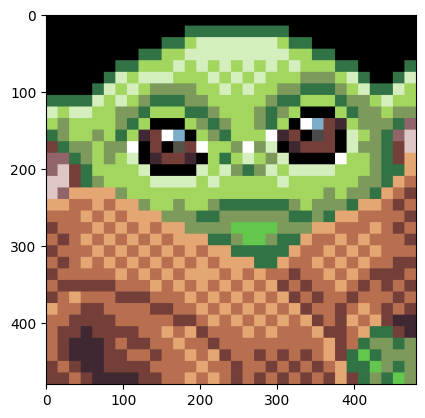

In [25]:
#Pixel Art
pixel_art = cv2.imread('grogu_pixelart.png')
pixel_art2 = cv2.cvtColor(pixel_art, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(pixel_art2)
plt.grid(False)
plt.show()

In [27]:
pixel_scale = makeScale(3, 'a', 'HARMONIC_MINOR')
pixel_song, pixel_df,pixel_df_harmony = img2music(pixel_art, 
                                                  pixel_scale, 
                                                  T = 0.2, 
                                                  randomPixels = True)

wavfile.write('grogu_pixelsong.wav'    , rate = 22050, data = pixel_song.astype(np.float32))
ipd.Audio(pixel_song, rate = sr)

So cool! now I wanted to play with Pedalboard module from Spotify. Pedalboard was built by Spotify's Audio Intelligence Lab to enable using studio-quality audio effects from within Python and TensorFlow. Internally at Spotify, pedalboard is used for data augmentation to improve machine learning models. 

In [37]:
# Adding effects to music using Paddleboard
from pedalboard import Pedalboard, Chorus, Reverb, Compressor, Gain, LadderFilter 
from pedalboard import Phaser, Delay, PitchShift, Distortion
from pedalboard.io import AudioFile
# Read in a whole audio file:
with AudioFile('grogu_pixelsong.wav', 'r') as f:
    audio = f.read(f.frames)
    samplerate = f.samplerate

# Make a Pedalboard object, containing multiple plugins:
board = Pedalboard([
    #Delay(delay_seconds=0.25, mix=1.0),
    Compressor(threshold_db=-100, ratio=25),
    Gain(gain_db=150),
    Chorus(),
    LadderFilter(mode=LadderFilter.Mode.HPF12, cutoff_hz=900),
    Phaser(),
    Reverb(room_size=0.5),
])

# Run the audio through this pedalboard!
effected = board(audio, samplerate)

# Write the audio back as a wav file:
with AudioFile('processed-grogu_pixelsong.wav', 'w', samplerate, effected.shape[0]) as f:
    f.write(effected)

ipd.Audio('processed-grogu_pixelsong.wav')

even cooler sounding now! now let's play with non pixelated image!

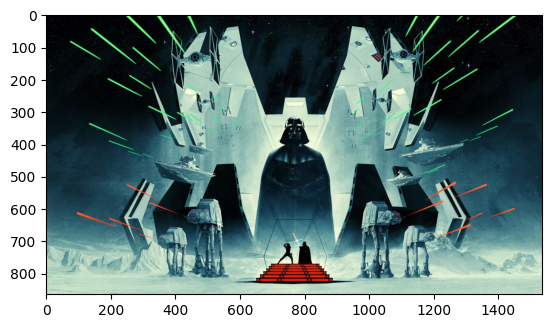

In [28]:
# Star wars
starwars1 = cv2.imread('starwars1.jpg')
starwars1 = cv2.cvtColor(starwars1, cv2.COLOR_BGR2RGB)
plt.figure()
plt.imshow(starwars1)
plt.grid(False)
plt.show()

In [38]:
starwars1_scale = makeScale(5, 'g', 'MAJOR')
starwars1_song, starwars1_df, starwars1_song_harmony  = img2music(starwars1, 
                                                                starwars1_scale, 
                                                                T = 0.3,
                                                                randomPixels = True, 
                                                                useOctaves = True)

wavfile.write('starwars1_song.wav'    , rate = 22050, data = starwars1_song.astype(np.float32))
ipd.Audio(starwars1_song, rate = sr)

In [33]:
# Adding effects to music using Pedalboard
from pedalboard import Pedalboard, Chorus, Reverb, Compressor, Gain, LadderFilter 
from pedalboard import Phaser, Delay, PitchShift, Distortion
from pedalboard.io import AudioFile
# Read in a whole audio file:
with AudioFile('starwars1_song.wav', 'r') as f:
    audio = f.read(f.frames)
    samplerate = f.samplerate

# Make a Pedalboard object, containing multiple plugins:
board = Pedalboard([
    #Delay(delay_seconds=0.25, mix=1.0),
    Compressor(threshold_db=-100, ratio=25),
    Gain(gain_db=150),
    Chorus(),
    LadderFilter(mode=LadderFilter.Mode.HPF12, cutoff_hz=900),
    Phaser(),
    Reverb(room_size=0.5),
])

# Run the audio through this pedalboard!
effected = board(audio, samplerate)

# Write the audio back as a wav file:
with AudioFile('processed-starwars1_song.wav', 'w', samplerate, effected.shape[0]) as f:
    f.write(effected)

ipd.Audio('processed-starwars1_song.wav')

### Conclusion
I showed how musics can be made from images and how our songs can be exported into .wav files for subsequent processing. There are tons of experimentation that can be done with this. A few examples I can think of:
- making a sentiment analysis from audio generated couple photos if whether their photos generate a happier or sadder songs
- using this as an art fraud detection